#BTC ALPHA NETWORK DESCRIPTIVE ANALYTICS NOTEBOOK
<section>
    <h3>Authors</h3>
    <ul>
        <li>Gwendoline Hays-Valentin - <a href="mailto:gwendoline.valentin@hotmail.fr">gwendoline.valentin@hotmail.fr</a>, University of Paris 1 Panthéon-Sorbonne </li>
        <li>Charaf ZGUIOUAR - <a href="mailto:zgcharaf@gmail.com">zgcharaf@gmail.com</a>, University of Paris 1 Panthéon-Sorbonne</li>
    </ul>
</section>
<h3>Source</h3>
<section>
    <p>The BTC Alpha dataset is a comprehensive collection representing the trust relationships among users of the Bitcoin Alpha platform, a trading environment where Bitcoin is the primary currency. This unique dataset includes nodes representing users, edges indicating trust ratings between users, and the weights of these edges signifying the degree of trust or distrust (ranging from -10 to +10). The data comes from a detailed study aimed at understanding the dynamics of trust within the context of cryptocurrency trading. For more information and access to the dataset, visit the <a href="https://snap.stanford.edu/data/soc-sign-bitcoin-alpha.html" target="_blank">Stanford Network Analysis Project (SNAP) website</a>.</p>
</section>


In [ ]:
# required libraries
!pip install prettytable
!pip install python-louvain

In [ ]:
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## Imports & read datasets in csv format

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from prettytable import PrettyTable
import seaborn as sns
from IPython.display import display
from IPython.core.interactiveshell import InteractiveShell
import networkx as nx
import numpy as np
from community import community_louvain
import plotly.graph_objects as go
from matplotlib.dates import date2num, num2date
from datetime import datetime
import matplotlib.cm as cm
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
from sklearn.metrics import precision_recall_curve, classification_report
from scipy.stats import entropy
from sklearn.ensemble import IsolationForest

In [ ]:
nodes = pd.read_csv('soc-sign-bitcoinalpha-dataset-nodes-table.csv')
edges = pd.read_csv('soc-sign-bitcoinalpha-dataset-edge-table.csv')
df =  pd.read_csv('soc-sign-bitcoinalpha.csv', header = None)
df =  df.rename(columns = {0:'SOURCE', 1:'TARGET', 2:'RATING', 3:'TIME'})


# **First Part : Descriptive Statistics**


## Overview tables
#### Below is a description of the columns of our dataset, in addition to summary stastics tables of the tables of our dataset.


In [ ]:
InteractiveShell.ast_node_interactivity = "all"
display(nodes.columns)
display(nodes.head())
display(nodes.dtypes)
print('-'*20)
print(edges.columns)
print(edges.head())
print(edges.dtypes)
print('-'*20)
print(df.columns)
print(df.head())
print(df.dtypes)

Index(['Id', 'Class', 'timeset', 'indegree', 'outdegree', 'Degree',
       'weighted indegree', 'weighted outdegree', 'Weighted Degree',
       'Eccentricity', 'closnesscentrality', 'harmonicclosnesscentrality',
       'betweenesscentrality', 'Authority', 'Hub', 'pageranks',
       'componentnumber', 'strongcompnum', 'modularity_class',
       'stat_inf_class', 'clustering', 'eigencentrality'],
      dtype='object')

,Id,Class,timeset,indegree,outdegree,Degree,weighted indegree,weighted outdegree,Weighted Degree,Eccentricity,...,betweenesscentrality,Authority,Hub,pageranks,componentnumber,strongcompnum,modularity_class,stat_inf_class,clustering,eigencentrality
0,7604,-1,NaN,73,21,94,-628,110,-518,6,...,0.002901,0.080527,0.025972,NaN,0,506,2,39,0.097339,0.388011
1,5342,-1,NaN,39,80,119,0,-249,-249,6,...,0.006124,0.048157,0.049823,NaN,0,506,13,32,0.040049,0.241042
2,7602,-1,NaN,17,13,30,-150,10,-140,7,...,0.000075,0.027852,0.021469,NaN,0,506,2,19,0.338768,0.142756
3,7594,-1,NaN,8,6,14,-61,-60,-121,7,...,0.000089,0.008680,0.007923,NaN,0,506,13,93,0.138889,0.047984
4,708,-1,NaN,7,24,31,12,-128,-116,7,...,0.000240,0.007487,0.011672,NaN,0,506,13,44,0.035000,0.035902


Id                              int64
Class                           int64
timeset                       float64
indegree                        int64
outdegree                       int64
Degree                          int64
weighted indegree               int64
weighted outdegree              int64
Weighted Degree                 int64
Eccentricity                    int64
closnesscentrality            float64
harmonicclosnesscentrality    float64
betweenesscentrality          float64
Authority                     float64
Hub                           float64
pageranks                     float64
componentnumber                 int64
strongcompnum                   int64
modularity_class                int64
stat_inf_class                  int64
clustering                    float64
eigencentrality               float64
dtype: object

--------------------
Index(['Source', 'Target', 'Type', 'Id', 'Label', 'timeset', 'Weight'], dtype='object')
   Source  Target      Type  Id  Label           timeset  Weight
0    7188       1  Directed   0    NaN  <[1407470400.0]>      10
1     430       1  Directed   1    NaN  <[1376539200.0]>      10
2    3134       1  Directed   2    NaN  <[1369713600.0]>      10
3    3026       1  Directed   3    NaN  <[1350014400.0]>      10
4    3010       1  Directed   4    NaN  <[1347854400.0]>      10
Source       int64
Target       int64
Type        object
Id           int64
Label      float64
timeset     object
Weight       int64
dtype: object
--------------------
Index(['SOURCE', 'TARGET', 'RATING', 'TIME'], dtype='object')
   SOURCE  TARGET  RATING        TIME
0    7188       1      10  1407470400
1     430       1      10  1376539200
2    3134       1      10  1369713600
3    3026       1      10  1350014400
4    3010       1      10  1347854400
SOURCE    int64
TARGET    int64
RATING    i

In [ ]:
# Summary table for 'nodes'
nodes_summary = PrettyTable()
nodes_summary.field_names = ["Attribute", "Description"]
nodes_summary.add_row(["Id", "Unique identifier for nodes"])
nodes_summary.add_row(["Class", "Classification of nodes"])
nodes_summary.add_row(["In/Outdegree", "Number of incoming/outgoing connections"])
nodes_summary.add_row(["Degree", "Total number of connections"])
nodes_summary.add_row(["Eccentricity", "Maximum distance from any other node"])
nodes_summary.add_row(["Centrality Measures", "Includes closeness, betweenness, eigencentrality, etc."])
nodes_summary.add_row(["Component Numbers", "Indicators for components and strong components"])
nodes_summary.add_row(["Modularity Class", "Community structure classification"])
nodes_summary.add_row(["Clustering", "The degree to which nodes cluster together"])
print("Summary for 'nodes' Dataset")
print(nodes_summary)
# Summary table for 'edges'
edges_summary = PrettyTable()
edges_summary.field_names = ["Attribute", "Description"]
edges_summary.add_row(["Source/Target", "Identifiers for the source and target of an edge"])
edges_summary.add_row(["Type", "Type of edge (Directed)"])
edges_summary.add_row(["Id", "Unique identifier for edges"])
edges_summary.add_row(["Label", "Optional label for edges"])
edges_summary.add_row(["Timeset", "Timestamp or time-related attribute for the edge"])
edges_summary.add_row(["Weight", "Weight of the edge, indicating strength or capacity"])
print("Summary for 'edges' Dataset")
print(edges_summary)
# Summary table for 'df'
df_summary = PrettyTable()
df_summary.field_names = ["Attribute", "Description"]
df_summary.add_row(["SOURCE/TARGET", "Identifiers for the source and target entities"])
df_summary.add_row(["RATING", "Rating or transaction value between the source and target"])
df_summary.add_row(["TIME", "Timestamp for when the rating or transaction occurred"])
print("Summary for 'df' Dataset")
print(df_summary)

Summary for 'nodes' Dataset
+---------------------+--------------------------------------------------------+
|      Attribute      |                      Description                       |
+---------------------+--------------------------------------------------------+
|          Id         |              Unique identifier for nodes               |
|        Class        |                Classification of nodes                 |
|     In/Outdegree    |        Number of incoming/outgoing connections         |
|        Degree       |              Total number of connections               |
|     Eccentricity    |          Maximum distance from any other node          |
| Centrality Measures | Includes closeness, betweenness, eigencentrality, etc. |
|  Component Numbers  |    Indicators for components and strong components     |
|   Modularity Class  |           Community structure classification           |
|      Clustering     |       The degree to which nodes cluster together       |


In [ ]:
quant_cols_nodes = ['indegree', 'outdegree', 'Degree', 'weighted indegree', 'weighted outdegree',
                    'Weighted Degree', 'Eccentricity', 'closnesscentrality',
                    'harmonicclosnesscentrality', 'betweenesscentrality',
                    'Authority', 'Hub', 'pageranks', 'clustering', 'eigencentrality']

# Calculate summary statistics
summary_stats_nodes = nodes[quant_cols_nodes].describe().transpose()

# Create PrettyTable
table_nodes = PrettyTable()
table_nodes.field_names = ["Variable", "Mean", "STD", "Min", "Median", "Max"]

for index, row in summary_stats_nodes.iterrows():
    table_nodes.add_row([index, f"{row['mean']:.2f}", f"{row['std']:.2f}", row['min'],
                         f"{nodes[index].median():.2f}", row['max']])
num_nodes = len(nodes)

# Adding the number of nodes to the summary table for 'nodes'
table_nodes.add_row(["---", "---", "---", "---", "---", "---"])  # Separator
table_nodes.add_row(["Number of Nodes", num_nodes, "", "", "", ""])


print("Summary Statistics for 'nodes'")
print(table_nodes)


###########################################################################EDGES


quant_cols_edges = ['Weight']

# Calculate summary statistics
summary_stats_edges = edges[quant_cols_edges].describe().transpose()

# Create PrettyTable
table_edges = PrettyTable()
table_edges.field_names = ["Variable", "Mean", "STD", "Min", "Median", "Max"]

for index, row in summary_stats_edges.iterrows():
    table_edges.add_row([index, f"{row['mean']:.2f}", f"{row['std']:.2f}", row['min'],
                         f"{edges[index].median():.2f}", row['max']])

# Assuming 'edges' DataFrame is already loaded
num_edges = len(edges)

# Adding the number of edges to the summary table for 'edges'
table_edges.add_row(["---", "---", "---", "---", "---", "---"])  # Separator
table_edges.add_row(["Number of Edges", num_edges, "", "", "", ""])

print("Summary Statistics for 'edges'")
print(table_edges)

###########################################################################DF
df['DATE'] = pd.to_datetime(df['TIME'], unit='s')

# Calculate summary statistics for 'RATING'
summary_stats_rating = df['RATING'].describe().transpose()

# Calculate statistics for 'DATE'
earliest_date = df['DATE'].min().strftime('%Y-%m-%d')
latest_date = df['DATE'].max().strftime('%Y-%m-%d')

# Create PrettyTable for 'RATING'
table_df = PrettyTable()
table_df.field_names = ["Variable", "Mean", "STD", "Min", "Median", "Max"]

table_df.add_row([
    "RATING",
    f"{summary_stats_rating['mean']:.2f}",
    f"{summary_stats_rating['std']:.2f}",
    int(summary_stats_rating['min']),
    f"{df['RATING'].median():.2f}",
    int(summary_stats_rating['max'])
])

# Add Date Range to Table
table_df.add_row(["DATE Range", "", "", earliest_date, "", latest_date])


# 'df' DataFrame already includes a converted 'DATE' column
num_rows_df = len(df)

# Adding the number of rows to the summary table for 'df'
table_df.add_row(["---", "---", "---", "---", "---", "---"])  # Separator
table_df.add_row(["Number of Rows", num_rows_df, "", "", "", ""])

print("Summary Statistics for 'df' with Dates")
print(table_df)

###################################################################

Summary Statistics for 'nodes'
+----------------------------+-------+-------+--------+--------+----------+
|          Variable          |  Mean |  STD  |  Min   | Median |   Max    |
+----------------------------+-------+-------+--------+--------+----------+
|          indegree          |  6.39 | 16.41 |  0.0   |  2.00  |  398.0   |
|         outdegree          |  6.39 | 18.29 |  0.0   |  2.00  |  490.0   |
|           Degree           | 12.79 | 34.45 |  1.0   |  4.00  |  888.0   |
|     weighted indegree      |  9.36 | 36.94 | -628.0 |  3.00  |  758.0   |
|     weighted outdegree     |  9.36 | 28.53 | -249.0 |  3.00  |  604.0   |
|      Weighted Degree       | 18.72 | 60.78 | -518.0 |  6.00  |  1362.0  |
|        Eccentricity        |  5.81 |  2.39 |  0.0   |  7.00  |   10.0   |
|     closnesscentrality     |  0.25 |  0.12 |  0.0   |  0.27  |   1.0    |
| harmonicclosnesscentrality |  0.26 |  0.12 |  0.0   |  0.28  |   1.0    |
|    betweenesscentrality    |  0.00 |  0.00 |  0.0   |  

/usr/local/lib/python3.10/dist-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [ ]:
edges.describe()

,Source,Target,Id,Label,Weight
count,24186.000000,24186.000000,24186.000000,0.0,24186.000000
mean,864.029314,1051.093815,12092.500000,NaN,1.463946
std,1592.085638,1871.765504,6982.041141,NaN,2.903656
min,1.000000,1.000000,0.000000,NaN,-10.000000
25%,58.000000,66.000000,6046.250000,NaN,1.000000
50%,238.000000,279.000000,12092.500000,NaN,1.000000
75%,898.000000,1068.000000,18138.750000,NaN,2.000000
max,7604.000000,7604.000000,24185.000000,NaN,10.000000


## Exploratory analysis


#### Number of transactions & over time
#### A bit of history :


1. 2011: On 13 June 2011, the Mt. Gox bitcoin exchange reported some BTC 25,000 (US$400,000 at the time) had been stolen from 478 accounts. Then on Friday 17 June, Mt. Gox's user database leaked for sale to pastebin, signed by cRazIeStinGeR and tied to auto36299386@hushmail.com. The theft of Bitcoins from Mt. Gox accounts continued, reportedly, throughout that day

2. 2014: Straight after the price markup that saw Bitcoin soar in value in
December 2013, came an instant drop in the prices from 1,164 USD, to 760 USD. This was the very first time the Bitcoin market dropped as low as this.

3.   2015: From Bad to Worse The drop didn't stop. By 2015, the cryptocurrency market went through extreme volatility. This caused Bitcoin to drop to an astonishing new low of 315 USD, all the way from 760 USD. A catastrophic loss of 241% was recorded at the time.





<Figure size 1200x600 with 0 Axes>

<Axes: title={'center': 'Number of Transactions Over Time'}, xlabel='datetime'>

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Number of Transactions')

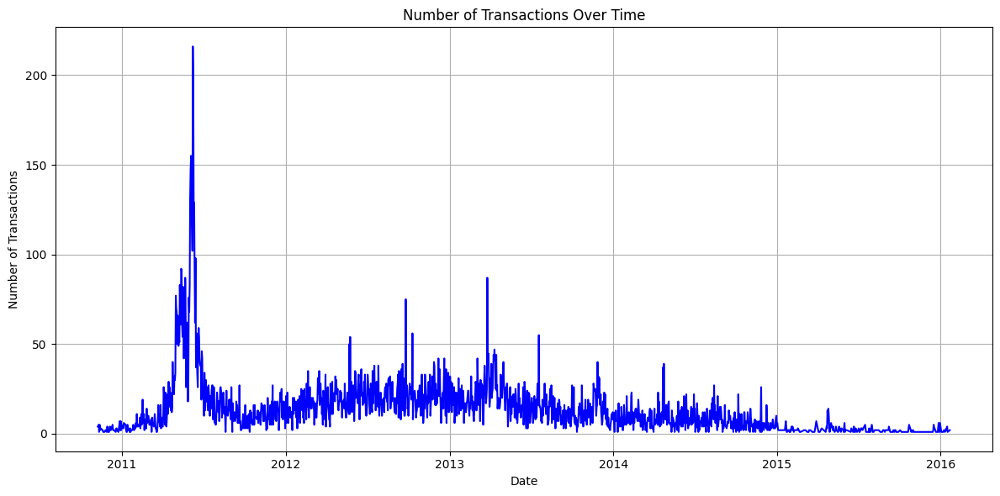

In [ ]:
# Convert Unix timestamp to datetime
df['datetime'] = pd.to_datetime(df['TIME'], unit='s')

# Group by datetime to count the number of transactions per day
transactions_per_day = df.groupby(df['datetime'].dt.date).count()['TIME']

# Plotting the number of transactions over time
plt.figure(figsize=(12, 6))
transactions_per_day.plot(kind='line', title='Number of Transactions Over Time', color='blue')
plt.xlabel('Date')
plt.ylabel('Number of Transactions')
plt.grid(True)
plt.tight_layout()
plt.show()


<Figure size 1200x600 with 0 Axes>

<Axes: xlabel='datetime'>

<Axes: xlabel='datetime'>

Text(0.5, 1.0, 'Mean and Variance of Ratings over time.')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Trust Standard Variance and Mean')

<function matplotlib.pyplot.title(label, fontdict=None, loc=None, pad=None, *, y=None, **kwargs)>

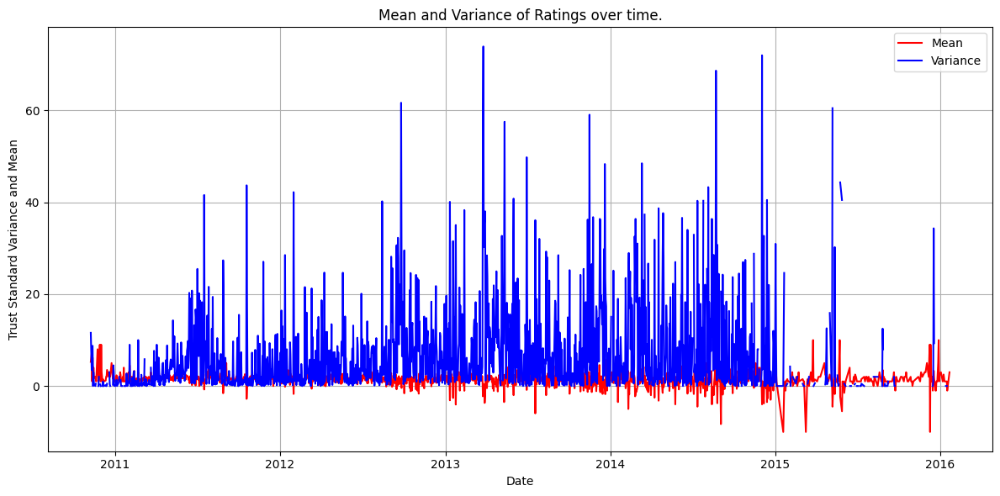

In [ ]:
# Convert Unix timestamp to datetime
df['datetime'] = pd.to_datetime(df['TIME'], unit='s')

# Group by datetime to count the number of transactions per day
transactions_per_day = df.groupby(df['datetime'].dt.date)['RATING'].mean()
std = df.groupby(df['datetime'].dt.date)['RATING'].var()

# Plotting the number of transactions over time
plt.figure(figsize=(12, 6))
transactions_per_day.plot(kind='line', color='red', label='Mean')
std.plot(kind='line', color='blue', label = 'Variance')
plt.title('Mean and Variance of Ratings over time.')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Trust Standard Variance and Mean')
plt.title
plt.grid(True)
plt.tight_layout()
plt.show()


#### Top active nodes

In [ ]:
# Counting occurrences of each address as source and target, then summing these counts
source_activities = df['SOURCE'].value_counts()
target_activities = df['TARGET'].value_counts()
total_activities = source_activities.add(target_activities, fill_value=0).sort_values(ascending=False)

# Displaying the top 10 addresses with the highest activities
top_10_active_addresses = total_activities.head(10)

print(top_10_active_addresses)


1      888.0
3      494.0
4      416.0
7      407.0
11     406.0
2      400.0
177    400.0
8      393.0
10     341.0
15     320.0
dtype: float64


#### Distribution of Ratings


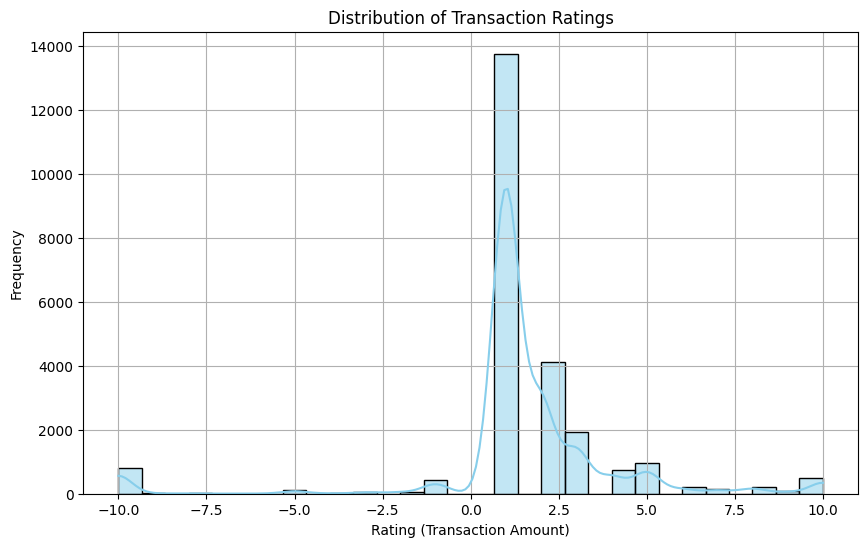

In [ ]:
# Convert the 'RATING' column to numeric, if it's not already
df['RATING'] = pd.to_numeric(df['RATING'], errors='coerce')

# Plotting the distribution of transaction ratings
plt.figure(figsize=(10, 6))
sns.histplot(df['RATING'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Transaction Ratings')
plt.xlabel('Rating (Transaction Amount)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [ ]:
G = nx.from_pandas_edgelist(df, source='SOURCE', target='TARGET', edge_attr='RATING', create_using=nx.DiGraph())
betweenness_centrality = nx.betweenness_centrality(G)
eigenvector_centrality = nx.eigenvector_centrality(G, max_iter=1000)

In [ ]:
avg_trust_ratings = df.groupby('TARGET')['RATING'].mean().to_dict()

In [ ]:
# Convert dictionaries to DataFrames
df_betweenness = pd.DataFrame(list(betweenness_centrality.items()), columns=['Node', 'Betweenness'])
df_eigenvector = pd.DataFrame(list(eigenvector_centrality.items()), columns=['Node', 'Eigenvector'])
df_trust = pd.DataFrame(list(avg_trust_ratings.items()), columns=['Node', 'AvgTrustRating'])

# Merge on Node
df_centralities = df_betweenness.merge(df_eigenvector, on='Node').merge(df_trust, on='Node')


### Explore the relationship between network attributes and ratings

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Betweenness', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'Betweenness Centrality vs. Average Trust Rating')

Text(0.5, 0, 'Betweenness Centrality')

Text(0, 0.5, 'Average Trust Rating')

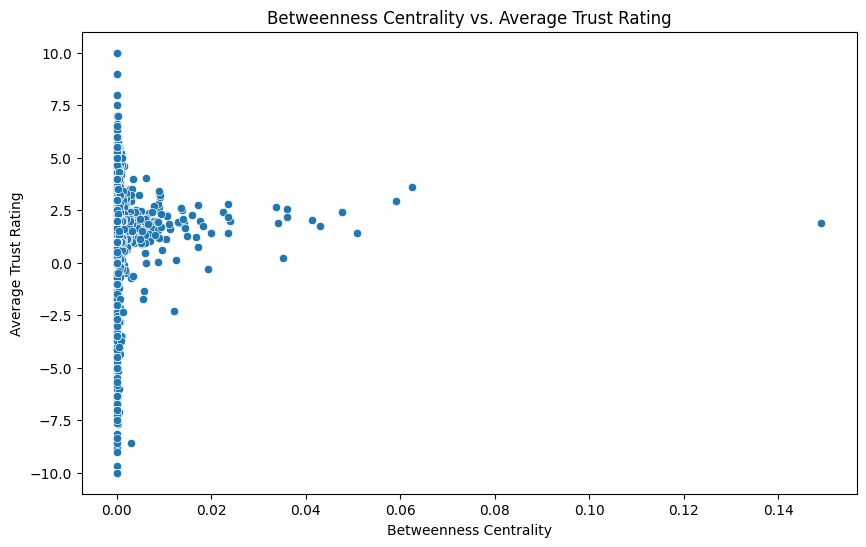

In [ ]:
# Betweenness Centrality vs. Avg Trust Rating
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_centralities, x='Betweenness', y='AvgTrustRating')
plt.title('Betweenness Centrality vs. Average Trust Rating')
plt.xlabel('Betweenness Centrality')
plt.ylabel('Average Trust Rating')
plt.show()

Nodes that act as bridges (high betweenness centrality) in the network do not often receive extreme negative trust ratings. It seems that being a bridge correlates with a minimum level of trustworthiness, likely because these nodes facilitate transactions or information flow within the network and are therefore less likely to be distrusted.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Eigenvector', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'Eigenvector Centrality vs. Average Trust Rating')

Text(0.5, 0, 'Eigenvector Centrality')

Text(0, 0.5, 'Average Trust Rating')

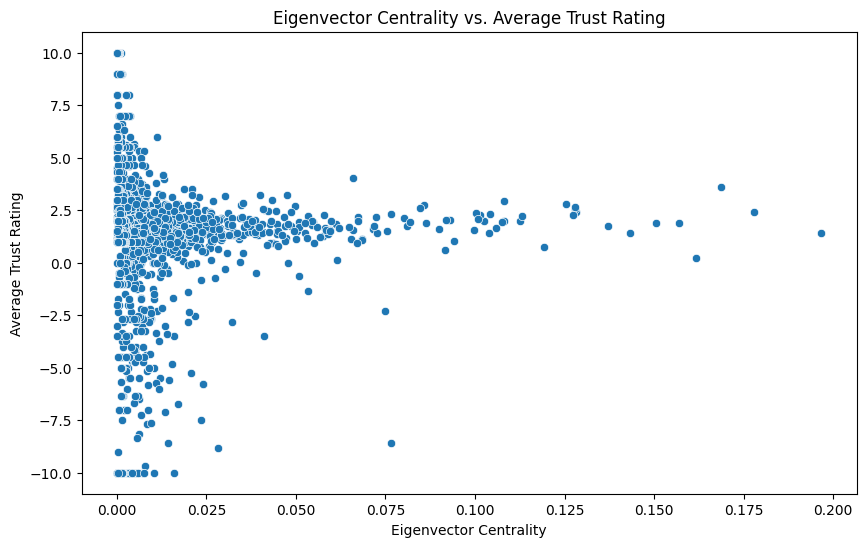

In [ ]:
# Eigenvector Centrality vs. Avg Trust Rating
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_centralities, x='Eigenvector', y='AvgTrustRating')
plt.title('Eigenvector Centrality vs. Average Trust Rating')
plt.xlabel('Eigenvector Centrality')
plt.ylabel('Average Trust Rating')
plt.show()


The second plot shows that nodes with high eigenvector centrality tend to have average to high positive trust ratings, with very few low or negative ratings. As eigenvector centrality decreases, the range of trust ratings becomes more diverse, including more negative ratings.

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='InDegreeCentrality', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'In-Degree Centrality vs. Average Trust Rating')

Text(0.5, 0, 'In-Degree Centrality')

Text(0, 0.5, 'Average Trust Rating')

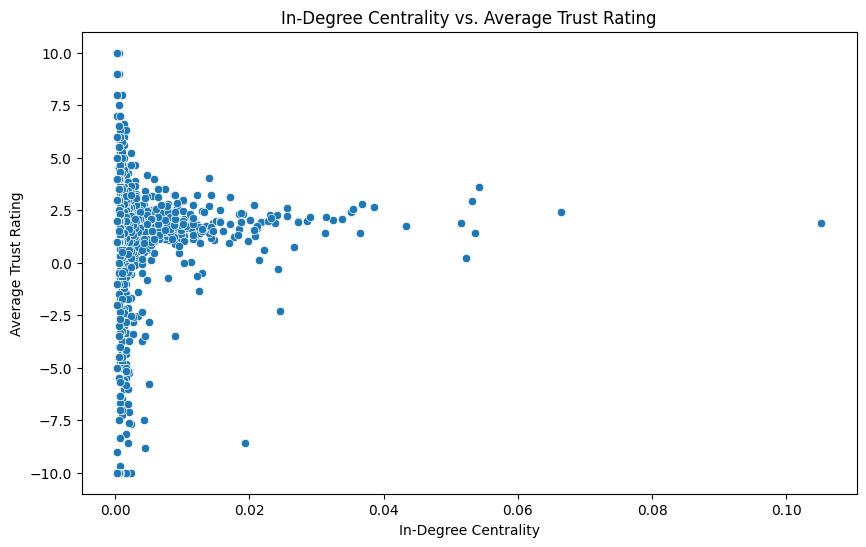

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='OutDegreeCentrality', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'Out-Degree Centrality vs. Average Trust Rating')

Text(0.5, 0, 'Out-Degree Centrality')

Text(0, 0.5, 'Average Trust Rating')

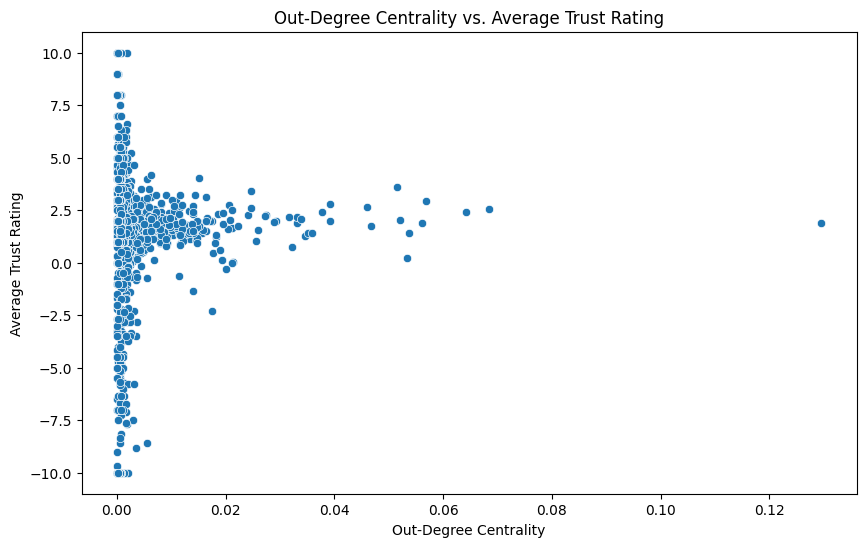

In [ ]:
in_degrees = nx.in_degree_centrality(G)
out_degrees = nx.out_degree_centrality(G)

# Convert these dictionaries to DataFrames for easy plotting
df_in_degrees = pd.DataFrame(in_degrees.items(), columns=['Node', 'InDegreeCentrality'])
df_out_degrees = pd.DataFrame(out_degrees.items(), columns=['Node', 'OutDegreeCentrality'])

# Merge these DataFrames with the DataFrame containing average trust ratings ('df_centralities')
df_centralities = df_centralities.merge(df_in_degrees, on='Node').merge(df_out_degrees, on='Node')

# Now you can create scatter plots to analyze the relationship between trust and degree centralities
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_centralities, x='InDegreeCentrality', y='AvgTrustRating')
plt.title('In-Degree Centrality vs. Average Trust Rating')
plt.xlabel('In-Degree Centrality')
plt.ylabel('Average Trust Rating')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_centralities, x='OutDegreeCentrality', y='AvgTrustRating')
plt.title('Out-Degree Centrality vs. Average Trust Rating')
plt.xlabel('Out-Degree Centrality')
plt.ylabel('Average Trust Rating')
plt.show()


#### Understand the relationship between the diversity of the nodes and the rating.

<ipython-input-13-4702408552de>:13: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  neighbor_counts = pd.Series(neighbors).value_counts(normalize=True)
<ipython-input-13-4702408552de>:13: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  neighbor_counts = pd.Series(neighbors).value_counts(normalize=True)
<ipython-input-13-4702408552de>:13: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  neighbor_counts = pd.Series(neighbors).value_counts(normalize=True)
<ipython-input-13-4702408552de>:13: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  

<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Diversity', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'Trust Rating vs. Connection Diversity')

Text(0.5, 0, 'Connection Diversity (Entropy)')

Text(0, 0.5, 'Average Trust Rating')

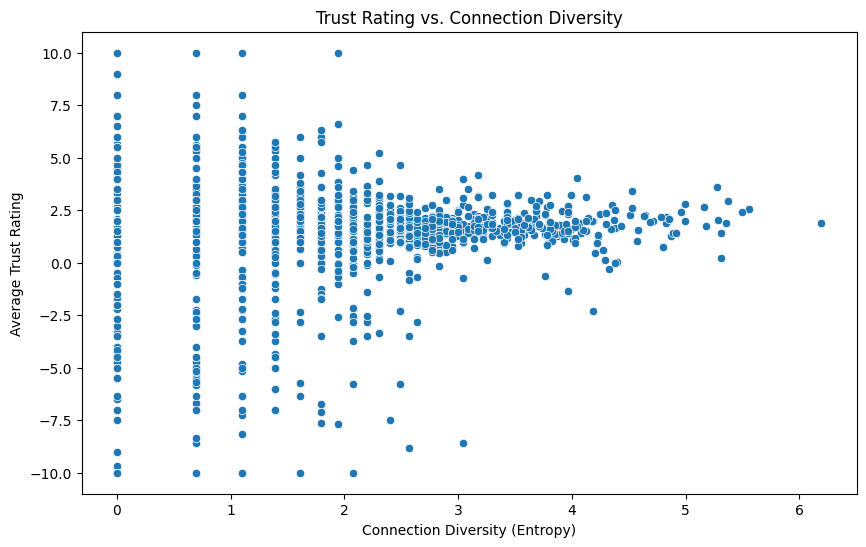

In [ ]:
# Function to calculate the diversity of connections for a node
def calculate_diversity(G, node):
    neighbors = list(G.neighbors(node))
    neighbor_counts = pd.Series(neighbors).value_counts(normalize=True)
    diversity = entropy(neighbor_counts)
    return diversity

# Calculate diversity for each node
diversity_scores = {node: calculate_diversity(G, node) for node in G.nodes()}

# Get average trust ratings per node
average_trust = {node: np.mean([data['RATING'] for n1, n2, data in G.in_edges(node, data=True)]) for node in G.nodes()}

# Create DataFrame from the dictionaries
df_diversity_trust = pd.DataFrame({
    'Node': diversity_scores.keys(),
    'Diversity': diversity_scores.values(),
    'AvgTrustRating': average_trust.values()
})

# Plotting the Trust Rating vs. Connection Diversity
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_diversity_trust, x='Diversity', y='AvgTrustRating')
plt.title('Trust Rating vs. Connection Diversity')
plt.xlabel('Connection Diversity (Entropy)')
plt.ylabel('Average Trust Rating')
plt.show()


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='Node', ylabel='AvgTrustRating'>

Text(0.5, 1.0, 'Network Assortativity and Average Trust Rating')

Text(0.5, 0, 'Node')

Text(0, 0.5, 'Average Trust Rating')

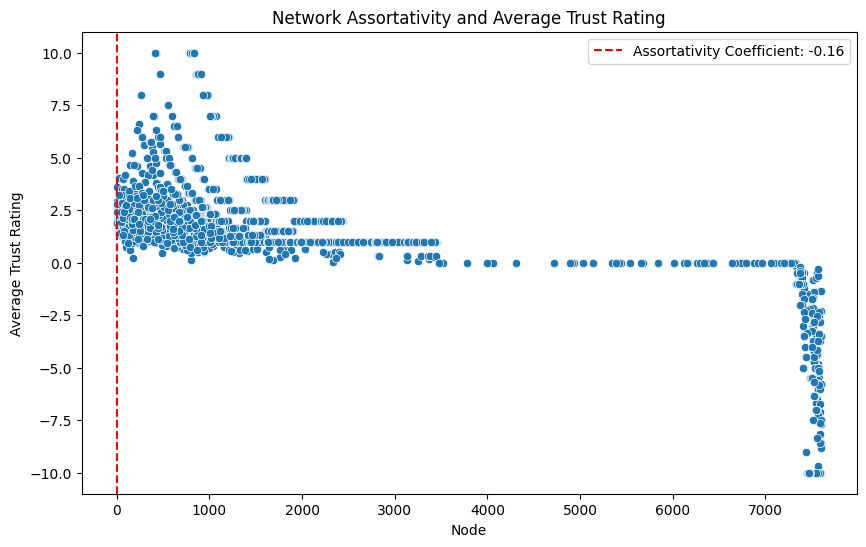

Network Assortativity Coefficient: -0.16348431165342667


In [ ]:
G = nx.from_pandas_edgelist(df, 'SOURCE', 'TARGET', edge_attr='RATING', create_using=nx.DiGraph())

# Step 2: Calculate the assortativity coefficient
assortativity = nx.degree_assortativity_coefficient(G)

# Step 3: Calculate the average trust rating for each node
# Since the trust rating is from source to target, we'll calculate the average of incoming edges for each node
trust_ratings = {}
for node in G.nodes():
    ratings = [data['RATING'] for _, _, data in G.in_edges(node, data=True)]
    trust_ratings[node] = sum(ratings) / len(ratings) if ratings else 0

# Convert trust ratings to a DataFrame for easy plotting
trust_ratings_df = pd.DataFrame(list(trust_ratings.items()), columns=['Node', 'AvgTrustRating'])

# Step 4: Plotting
# Since assortativity is a scalar, it will be constant for all points, hence we plot it as a line
plt.figure(figsize=(10, 6))
sns.scatterplot(data=trust_ratings_df, x='Node', y='AvgTrustRating')
plt.axvline(x=assortativity, color='red', linestyle='--', label=f'Assortativity Coefficient: {assortativity:.2f}')
plt.title('Network Assortativity and Average Trust Rating')
plt.xlabel('Node')
plt.ylabel('Average Trust Rating')
plt.legend()
plt.show()

# Output the assortativity coefficient
print(f'Network Assortativity Coefficient: {assortativity}')


# **Second part : Network Plots & Statistics and Exploration**

***1- Visualisation of relationships of trust and mistrust***

We decided to calculate a trust metric for each node based on the average weight of its connected edges, where the weight signifies the level of trust (positive weights) or distrust (negative weights). Nodes are then colored on a gradient from red (representing lower or negative trust levels) to green (representing higher or positive trust levels) according to their calculated trust metric. A color bar is added to help interpret the trust metric's scale from distrust to trust, visually representing the network's trust dynamics.

In [ ]:
df = pd.read_csv('/content/soc-sign-bitcoinalpha.csv', names=['source', 'target', 'weight', 'timestamp'])
G = nx.from_pandas_edgelist(df, 'source', 'target', ['weight', 'timestamp'], create_using=nx.DiGraph())

# Filter edges with high trust values (e.g., weights > 8) and high distrust values (e.g., weights < -8)
high_trust_edges = [(u, v, d) for u, v, d in G.edges(data=True) if d['weight'] > 8]
high_distrust_edges = [(u, v, d) for u, v, d in G.edges(data=True) if d['weight'] < -8]

# Create a subgraph with these high trust and high distrust edges
HD_subgraph = G.edge_subgraph([(u, v) for u, v, d in high_trust_edges + high_distrust_edges]).copy()

# Calculate degree for each node in the subgraph to highlight more connected (influential) individuals
node_degrees_hd = [HD_subgraph.degree(n) * 100 for n in HD_subgraph.nodes]

# Use edge weight for color scale: High positive (green for trust), High negative (red for distrust)
edge_colors_hd = ['green' if HD_subgraph[u][v]['weight'] > 0 else 'red' for u, v in HD_subgraph.edges]
pos_hd = nx.spring_layout(HD_subgraph, seed=42)

<ipython-input-5-05d2c9d9a970>:31: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(mappable, shrink=0.5, aspect=5, label='Trust Metric (Distrust <-> Trust)')


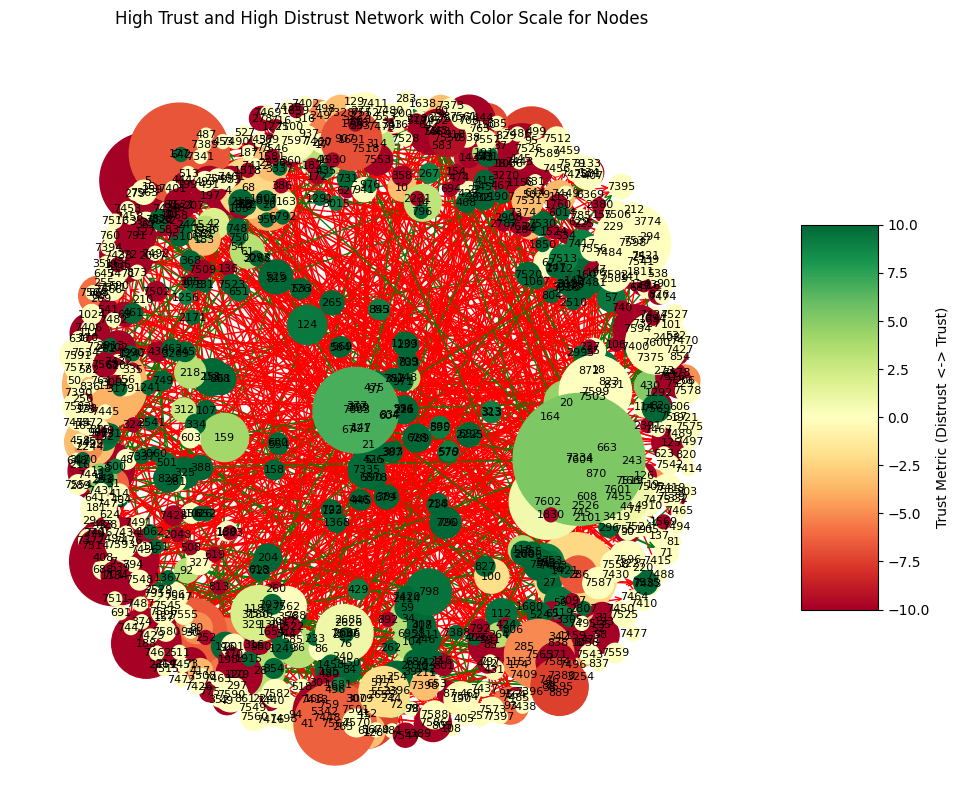

In [ ]:
node_trust_metric = {}
for node in HD_subgraph.nodes():
    weights = [data['weight'] for u, v, data in HD_subgraph.edges(node, data=True)]
    if weights:
        node_trust_metric[node] = np.mean(weights)
    else:
        node_trust_metric[node] = 0

# Set node colors based on the trust metric
# Using a color scale from red (distrust) to green (trust)
min_metric = min(node_trust_metric.values())
max_metric = max(node_trust_metric.values())
node_colors = [plt.cm.RdYlGn((node_trust_metric[n] - min_metric) / (max_metric - min_metric)) for n in HD_subgraph.nodes()]

# Use ScalarMappable to map scalar colors to a color scale
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Normalize trust metrics for color mapping
norm = Normalize(vmin=min(node_trust_metric.values()), vmax=max(node_trust_metric.values()))
mappable = ScalarMappable(norm=norm, cmap=plt.cm.RdYlGn)

# Draw the subgraph as before
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(HD_subgraph, seed=42)
nx.draw_networkx_edges(HD_subgraph, pos, edge_color=edge_colors_hd, arrowstyle='->', arrowsize=10)
nx.draw_networkx_nodes(HD_subgraph, pos, node_color=[mappable.to_rgba(node_trust_metric[n]) for n in HD_subgraph.nodes()], node_size=node_degrees_hd)
nx.draw_networkx_labels(HD_subgraph, pos, font_size=8, font_color='black')

# Add the colorbar
plt.colorbar(mappable, shrink=0.5, aspect=5, label='Trust Metric (Distrust <-> Trust)')
plt.title('High Trust and High Distrust Network with Color Scale for Nodes')
plt.axis('off')
plt.show()

In [ ]:
# Creating a subgraph based on trust and distrust weights
subgraph_edges = [(u, v) for u, v, d in G.edges(data=True) if d['weight'] > 8 or d['weight'] < -8]
HD_subgraph = G.edge_subgraph(subgraph_edges).copy()

# Positioning nodes using nx.spring_layout or another method
pos = nx.spring_layout(HD_subgraph, seed=42)

# Creating traces for edges with colors based on weight
edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.5),
    hoverinfo='none',
    mode='lines')

for edge in HD_subgraph.edges(data=True):
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    color = 'green' if edge[2]['weight'] > 0 else 'red'
    edge_trace['x'] += tuple([x0, x1, None])
    edge_trace['y'] += tuple([y0, y1, None])
    edge_trace['line']['color'] = color  # Set the edge color

# Creating traces for nodes with sizes based on degree
node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers+text',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='RdYlGn',
        size=[],
        color=[],
        colorbar=dict(
            title='Trust Metric',
            tickvals=[-1, 0, 1],
            ticktext=['Distrust', 'Neutral', 'Trust'],
            ticks='outside'
        ),
        line_width=2))

# Adding node information to the trace
for node in HD_subgraph.nodes():
    x, y = pos[node]
    node_trace['x'] += tuple([x])
    node_trace['y'] += tuple([y])
    node_trace['text'] += tuple([f'{node}'])
    node_trace['marker']['size'] += tuple([HD_subgraph.degree(node)])
    trust_metric = np.mean([data['weight'] for u, v, data in HD_subgraph.edges(node, data=True)])
    node_trace['marker']['color'] += tuple([trust_metric])

# Defining figure layout
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title='High Trust and High Distrust Network with Color Scale for Nodes',
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    height=800))

# Display the figure
fig.show()

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


*b) Network Statistics and Exploration*

In [ ]:
def compute_network_overview(graph):
    num_nodes = nx.number_of_nodes(graph)
    num_edges = nx.number_of_edges(graph)
    return num_nodes, num_edges

def compute_average_degree(graph):
    return np.mean([degree for node, degree in graph.degree()])

def compute_density(graph):
    return nx.density(graph)

def compute_transitivity_and_clustering(graph):
    transitivity = nx.transitivity(graph)
    average_clustering = nx.average_clustering(graph, weight='weight')
    return transitivity, average_clustering

def compute_average_shortest_path_length(graph):
    if nx.is_connected(graph.to_undirected()):
        return nx.average_shortest_path_length(graph)
    else:
        return float('inf')

def compute_individual_node_stats(graph):
    individual_stats = {}
    for node in graph.nodes():
        degree = graph.degree(node)
        in_degree = graph.in_degree(node)
        out_degree = graph.out_degree(node)
        clustering = nx.clustering(graph, node, weight='weight')
        average_neighbor_degree = np.mean([graph.degree(neighbor) for neighbor in graph.neighbors(node)])
        individual_stats[node] = {
            'degree': degree,
            'in_degree': in_degree,
            'out_degree': out_degree,
            'clustering': clustering,
            'average_neighbor_degree': average_neighbor_degree
        }
    return individual_stats

# Calculate network-level statistics
assortativity_coefficient = nx.degree_assortativity_coefficient(HD_subgraph)
average_clustering = nx.average_clustering(HD_subgraph)


# Calculate node-level statistics
degrees = dict(HD_subgraph.degree())
in_degrees = dict(HD_subgraph.in_degree())
out_degrees = dict(HD_subgraph.out_degree())
betweenness = nx.betweenness_centrality(HD_subgraph)
closeness = nx.closeness_centrality(HD_subgraph)
eigenvector = nx.eigenvector_centrality(HD_subgraph)

# Convert to DataFrame for easier analysis and visualization
node_stats = pd.DataFrame({
    'Node': list(HD_subgraph.nodes()),
    'Degree': degrees.values(),
    'In-Degree': in_degrees.values(),
    'Out-Degree': out_degrees.values(),
    'Betweenness': betweenness.values(),
    'Closeness': closeness.values(),
    'Eigenvector': eigenvector.values()
})

# Compute network overview
num_nodes, num_edges = compute_network_overview(HD_subgraph)

# Compute average degree
average_degree = compute_average_degree(HD_subgraph)

# Compute density
density = compute_density(HD_subgraph)

# Compute transitivity and clustering
transitivity, average_clustering = compute_transitivity_and_clustering(HD_subgraph)

# Compute average shortest path length
average_shortest_path_length = compute_average_shortest_path_length(HD_subgraph)

# Compute individual node statistics
individual_node_stats = compute_individual_node_stats(HD_subgraph)

# Print all the insights
print("Network Overview:", (num_nodes, num_edges))
print("Average Degree:", average_degree)
print("Density:", density)
print("Transitivity and Clustering:", (transitivity, average_clustering))
print("Average Shortest Path Length:", average_shortest_path_length)
print("Individual Node Stats:", individual_node_stats)
print(f"Assortativity Coefficient: {assortativity_coefficient}")
print(f"Average Clustering Coefficient: {average_clustering}")
print(node_stats)

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning:

invalid value encountered in scalar divide



Network Overview: (838, 1394)
Average Degree: 3.3269689737470167
Density: 0.0019874366629313123
Transitivity and Clustering: (0.09272964736612974, 0.036515083931206414)
Average Shortest Path Length: inf
Individual Node Stats: {2048: {'degree': 1, 'in_degree': 0, 'out_degree': 1, 'clustering': 0, 'average_neighbor_degree': 3.0}, 1: {'degree': 9, 'in_degree': 8, 'out_degree': 1, 'clustering': 0, 'average_neighbor_degree': 5.0}, 2: {'degree': 36, 'in_degree': 26, 'out_degree': 10, 'clustering': 0.0038623814680265726, 'average_neighbor_degree': 8.9}, 3: {'degree': 4, 'in_degree': 3, 'out_degree': 1, 'clustering': 0, 'average_neighbor_degree': 90.0}, 4: {'degree': 12, 'in_degree': 11, 'out_degree': 1, 'clustering': 0.013888785097117214, 'average_neighbor_degree': 7.0}, 5: {'degree': 47, 'in_degree': 9, 'out_degree': 38, 'clustering': 0.001851851851851852, 'average_neighbor_degree': 3.3947368421052633}, 6: {'degree': 12, 'in_degree': 5, 'out_degree': 7, 'clustering': 0.014853682840086611, 'a

***2-Community detection over the time***

To observe the community over the time, we decided to use the Louvain algorithm. The Louvain algorithm is a method for community detection in networks, aiming to identify groups of nodes that are densely connected internally. It was developed by Vincent D. Blondel, Jean-Loup Guillaume, Renaud Lambiotte, and Étienne Lefebvre.

Here's how the Louvain algorithm works:

1. **Initialization**: Each node is initially assigned to its own community.

2. **Modularity Optimization**: The algorithm aims to maximize modularity, which measures the quality of the network division into communities. Modularity measures the difference between the actual number of links within communities and the expected number of links in a random network of the same type.

3. **Merge Phase**: The algorithm iterates to merge communities in a way that maximizes modularity. During each iteration, it goes through all nodes and moves them to neighboring communities if it improves modularity. This process of moving nodes is repeated until no further improvement in modularity can be achieved.

4. **Repeat Steps 2 and 3**: The steps of modularity optimization and community merging are repeated until no further node movement improves the overall modularity.

5. **Algorithm Termination**: The algorithm terminates when modularity can no longer be improved.

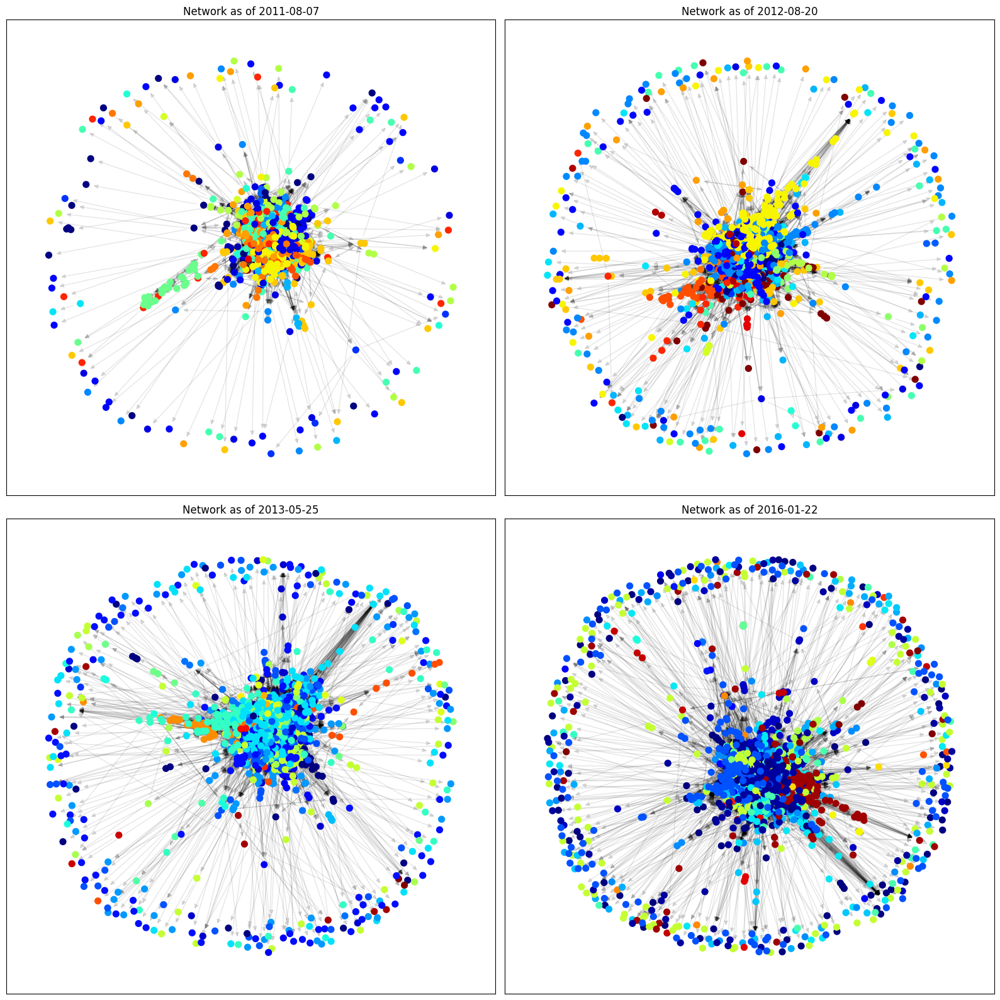

Metrics for the network as of 2011-08-07:
number_of_nodes: 1300
number_of_edges: 5937
average_degree: 9.133846153846154
density: 0.003515722153135548
average_clustering: 0.09408263634915126

Metrics for the network as of 2012-08-20:
number_of_nodes: 2207
number_of_edges: 11807
average_degree: 10.699592206615314
density: 0.002425111560882891
average_clustering: 0.12467453472070399

Metrics for the network as of 2013-05-25:
number_of_nodes: 3044
number_of_edges: 17314
average_degree: 11.375821287779237
density: 0.0018691786539236342
average_clustering: 0.14384097153325182

Metrics for the network as of 2016-01-22:
number_of_nodes: 3683
number_of_edges: 22650
average_degree: 12.299755633994026
density: 0.0016702547031496506
average_clustering: 0.16707708745263608



In [ ]:
# Convert timestamps into readable dtes
edges['Date'] = pd.to_datetime(edges['timeset'].str.extract(r'\<\[(.*?)\]\>')[0].astype(float), unit='s')

# Sort the data by date
edges_sorted = edges.sort_values(by='Date')

# Convert the dates into numerical values for plotting
edges_sorted['DateNum'] = date2num(edges_sorted['Date'])

# Select key moments based on the quartiles of the dates
key_dates = edges_sorted['DateNum'].quantile([0.25, 0.5, 0.75, 1.0]).values

# Initialize the figure for visualization
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 16))
positions = [(0, 0), (0, 1), (1, 0), (1, 1)]

# A dictionary to hold the metrics for each sub-network
network_metrics = {}

for date, ax_pos in zip(key_dates, positions):
    # Filter to include only edges up to the current date and with non-negative weights
    selected_edges = edges_sorted[(edges_sorted['DateNum'] <= date) & (edges_sorted['Weight'] >= 0)]
    G = nx.DiGraph()
    for _, edge in selected_edges.iterrows():
        G.add_edge(edge['Source'], edge['Target'], weight=edge['Weight'])

    # Calculate some network metrics
    number_of_nodes = G.number_of_nodes()
    number_of_edges = G.number_of_edges()
    average_degree = sum(dict(G.degree()).values()) / number_of_nodes
    density = nx.density(G)
    average_clustering = nx.average_clustering(G.to_undirected())

    # Store the metrics
    network_metrics[num2date(date).date()] = {
        'number_of_nodes': number_of_nodes,
        'number_of_edges': number_of_edges,
        'average_degree': average_degree,
        'density': density,
        'average_clustering': average_clustering
    }

    # Apply the Louvain algorithm to detect communities
    partition = community_louvain.best_partition(G.to_undirected())
    community_colors = [partition[node] for node in G.nodes()]

    # Use the spring layout algorithm to position nodes
    pos = nx.spring_layout(G)

    # Draw the nodes and edges
    nx.draw_networkx_edges(G, pos, ax=axes[ax_pos], alpha=0.1)
    nx.draw_networkx_nodes(G, pos, ax=axes[ax_pos], node_color=community_colors, node_size=50, cmap=plt.cm.jet)

    # Add a title with the date to illustrate the network's evolution
    axes[ax_pos].set_title(f"Network as of {num2date(date).date()}")

plt.tight_layout()
plt.show()

# Print the metrics for each network
for date, metrics in network_metrics.items():
    print(f"Metrics for the network as of {date}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print()

Note that the results of the Louvain algorithm may vary due to two main factors:

**Initialization dependency**: The algorithm starts by assignin each node to its own community. The results may therefore differ depending on how this initialisation is carried out. Variations in the initial choice of communities can lead to different partitions of the network.
**Local optimisation**: The Louvain algorithm performs iterative local optimisation to maximise modularity at each stage. This means that it can converge on a local optimum rather than a global optimum. As a result, the node movements made at each iteration may vary depending on the order in which the nodes are traversed, leading to different partitions.


Nevertheless, the results remain very similar and consistent between iterations.


In [ ]:
# Choose one of the key moments, here the last quartile (100% of the dates)
key_date = edges_sorted['DateNum'].quantile(1.0)
selected_edges = edges_sorted[(edges_sorted['DateNum'] <= key_date) & (edges_sorted['Weight'] >= 0)]
G = nx.DiGraph()
for _, edge in selected_edges.iterrows():
    G.add_edge(edge['Source'], edge['Target'], weight=abs(edge['Weight']))  # Use absolute weight

# Now apply the Louvain algorithm as before
partition = community_louvain.best_partition(G.to_undirected())
community_colors = [partition[node] for node in G.nodes()]

# Calculate positions for each node
pos = nx.spring_layout(G)

# Create edges in Plotly format
edge_x = []
edge_y = []
for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_x.append(x0)
    edge_x.append(x1)
    edge_x.append(None)
    edge_y.append(y0)
    edge_y.append(y1)
    edge_y.append(None)

edge_trace = go.Scatter(
    x=edge_x, y=edge_y,
    line=dict(width=0.5, color='#888'),
    hoverinfo='none',
    mode='lines')

# Create nodes in Plotly format
node_x = []
node_y = []
for node in G.nodes():
    x, y = pos[node]
    node_x.append(x)
    node_y.append(y)

node_trace = go.Scatter(
    x=node_x, y=node_y,
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YlGnBu',
        size=10,
        color=community_colors,
        colorbar=dict(
            thickness=15,
            title='Community',
            xanchor='left',
            titleside='right'
        ),
        line_width=2))

# Create a Plotly figure
fig = go.Figure(data=[edge_trace, node_trace],
             layout=go.Layout(
                title=f'Bitcoin Alpha Trust Network as of {num2date(key_date).date()}',
                titlefont_size=16,
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                annotations=[ dict(
                    text="Python code generated network visualisation with Plotly",
                    showarrow=False,
                    xref="paper", yref="paper",
                    x=0.005, y=-0.002 ) ],
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False))
                )

fig.show()

ICM simulation
The Independent Cascade Model is a simple model for the spread of influence in a network. In the context of trust ratings, you could interpret an "activation" as a decision to trust or distrust. When a node becomes active (decides to trust/distrust), it has a single chance to activate each of its currently inactive neighbors (to influence their trust/distrust decision).

Red nodes are those that have become active (influenced to trust/distrust).
Blue nodes remain inactive (not yet influenced).
Green labels might represent initial seed nodes.


# **Part 3 : Questions and Answers**

***1 - Simulations using the Independent Cascade Model: What impact does a drop of 50\% confidence have on the market?***

In [ ]:
import random

def independent_cascade(G, seeds, steps=0):
    active = set(seeds)
    new_active = set(seeds)

    # If steps is not 0, limit the number of iterations
    while new_active and (steps == 0 or len(active) < steps):
        # Set of nodes that will be activated in this iteration
        _new_active = set()
        # Iterate over each newly activated node
        for node in new_active:
            # Try to activate neighbors
            for neighbor in G.neighbors(node):
                if neighbor not in active:
                    # Activation success is determined by the trust rating as a probability
                    rating = G[node][neighbor]['RATING']
                    # Convert trust rating to a probability [0,1]
                    prob = (rating + 10) / 20  # Assuming ratings are from -10 to +10
                    if random.random() < prob:
                        _new_active.add(neighbor)
        new_active = _new_active
        active.update(new_active)
    return active


<Figure size 1200x800 with 0 Axes>

 ...]

{814: Text(0.0029145802836865187, -0.21181084215641022, '814'),
 827: Text(0.08177077025175095, 0.03593674302101135, '827'),
 791: Text(0.3253924548625946, -0.010987826623022556, '791'),
 808: Text(-0.011565984226763248, 0.2018885314464569, '808'),
 837: Text(0.8803738951683044, 0.5338240265846252, '837'),
 835: Text(0.8880569338798523, 0.15866446495056152, '835'),
 823: Text(0.05305157229304314, -0.204048752784729, '823'),
 418: Text(0.016445081681013107, -0.0715649202466011, '418'),
 805: Text(0.7628309726715088, 0.4423656165599823, '805'),
 806: Text(-0.06377764046192169, 0.050297584384679794, '806'),
 828: Text(0.370120108127594, 0.26476407051086426, '828'),
 414: Text(0.691500186920166, 0.5066583752632141, '414'),
 788: Text(0.0649162232875824, 0.04651198163628578, '788'),
 782: Text(-0.014727851375937462, 0.09021811932325363, '782'),
 797: Text(0.08965645730495453, 0.8691062927246094, '797'),
 829: Text(0.07188644260168076, 0.10218499600887299, '829'),
 831: Text(-0.0441693104803

Text(0.5, 1.0, 'Independent Cascade Model of Trust/Distrust Spread')

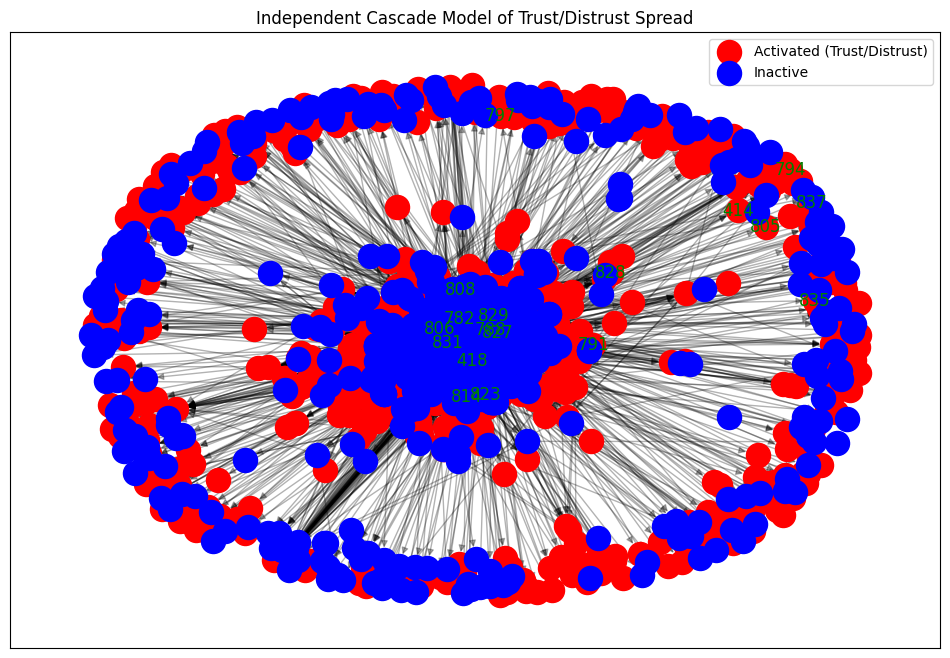

In [ ]:
num_seeds = int(0.005 * len(G.nodes()))
top_nodes_by_trust = sorted(trust_ratings.items(), key=lambda x: x[1], reverse=True)[:num_seeds]
seeds = [node for node, _ in top_nodes_by_trust]

activated_nodes = independent_cascade(G, seeds)

# The rest of the simulation and visualization follows.

activated_nodes = independent_cascade(G, seeds)

# Visualization
pos = nx.spring_layout(G)  # Or any other layout
plt.figure(figsize=(12, 8))
nx.draw_networkx_edges(G, pos, alpha=0.3)
nx.draw_networkx_nodes(G, pos, nodelist=activated_nodes, node_color='r', label='Activated (Trust/Distrust)')
nx.draw_networkx_nodes(G, pos, nodelist=set(G.nodes()) - activated_nodes, node_color='b', label='Inactive')
nx.draw_networkx_labels(G, pos, labels={node: node for node in seeds}, font_color='green')
plt.title('Independent Cascade Model of Trust/Distrust Spread')
plt.legend()
plt.show()


<Figure size 1500x1000 with 0 Axes>

 ...]

Text(0.5, 1.0, 'Independent Cascade Model Simulation')

(-1.2016538122296332,
 1.1221663096547125,
 -1.1751784229278563,
 1.1716221714019774)

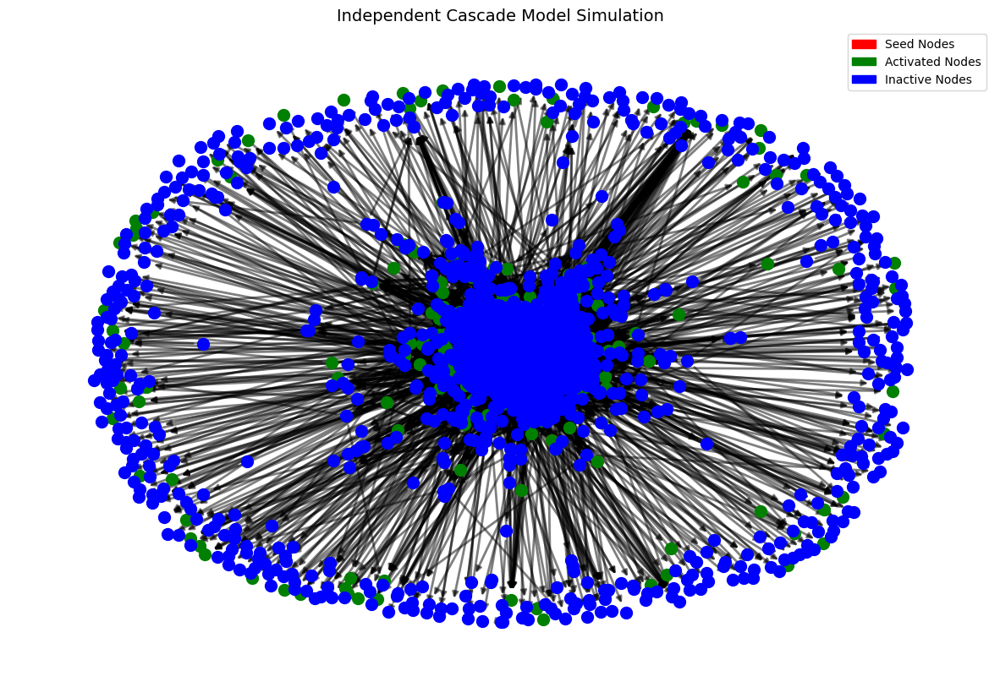

In [ ]:
# Function to simulate the Independent Cascade Model
def independent_cascade(G, seeds, p=0.1, steps=0):
    """
    Simulate the Independent Cascade model of influence propagation
    G: the graph
    seeds: list of initial active nodes
    p: probability of activation propagation
    steps: if 0, run until no more activations; otherwise, run for 'steps' iterations
    """
    active = set(seeds)
    new_active = set(seeds)

    while new_active and (steps == 0 or len(active) < steps):
        _new_active = set()
        for node in new_active:
            neighbors = set(G.neighbors(node)) - active
            for neighbor in neighbors:
                if random.random() < p:
                    _new_active.add(neighbor)
        active.update(_new_active)
        new_active = _new_active
    return active

# Identify the nodes to simulate a drop in trust
# We want to target the top 5% of nodes by betweenness centrality
top_5_percent = sorted(nx.betweenness_centrality(G).items(), key=lambda x: x[1], reverse=True)[:int(0.05 * len(G))]

# Simulate the drop in trust
# Assuming a 50% drop in trust rating
for node, _ in top_5_percent:
    for neighbor in G[node]:
        G[node][neighbor]['RATING'] *= 0.5

# Seed nodes for the simulation - the ones that experienced the drop
seed_nodes = [node for node, _ in top_5_percent]

# Run the Independent Cascade simulation
activated_nodes = independent_cascade(G, seed_nodes)

# Visualization of the result
pos = nx.spring_layout(G)  # Layout for the graph

# Draw the graph
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# For example, pos = nx.spring_layout(G, scale=2) for a spring layout with more spread out nodes

plt.figure(figsize=(15, 10))  # Increase figure size

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.5, width=2)  # Make edges more visible

# Draw nodes with specified options for better visibility
nx.draw_networkx_nodes(G, pos, nodelist=seed_nodes, node_size=100, node_color='red', label='Seed Nodes')
nx.draw_networkx_nodes(G, pos, nodelist=activated_nodes, node_size=100, node_color='green', label='Activated Nodes')
nx.draw_networkx_nodes(G, pos, nodelist=set(G.nodes()) - set(activated_nodes), node_size=100, node_color='blue', label='Inactive Nodes')

# Create custom legends
red_patch = mpatches.Patch(color='red', label='Seed Nodes')
green_patch = mpatches.Patch(color='green', label='Activated Nodes')
blue_patch = mpatches.Patch(color='blue', label='Inactive Nodes')
plt.legend(handles=[red_patch, green_patch, blue_patch])

plt.title('Independent Cascade Model Simulation', fontsize=14)
plt.axis('off')
plt.show()


#### 2014 BTC fraud induced a slight drop in confidence across the netwrk of BTC-ALPHA

In [ ]:

df['datetime'] = pd.to_datetime(df['TIME'], unit='s')

start_date_event = pd.to_datetime('2014-02-01')
end_date_event = pd.to_datetime('2014-02-28')

# Filter data for the event period and for normal periods
# Assuming 'normal' is defined as the month before the event
event_data = df[(df['datetime'] >= start_date_event) & (df['datetime'] <= end_date_event)]
normal_data = df[(df['datetime'] >= start_date_event - pd.DateOffset(months=1)) &
                 (df['datetime'] < start_date_event)]

# Create graphs for both periods
G_event = nx.from_pandas_edgelist(event_data, source='SOURCE', target='TARGET', edge_attr='RATING', create_using=nx.DiGraph())
G_normal = nx.from_pandas_edgelist(normal_data, source='SOURCE', target='TARGET', edge_attr='RATING', create_using=nx.DiGraph())

# Calculate network statistics for each graph
# Example: Average trust rating (using the 'Weight' as a proxy for trust rating)
avg_trust_event = event_data['RATING'].mean()
avg_trust_normal = normal_data['RATING'].mean()

# Compare statistics between the two periods
comparison_stats = {
    'average_trust_event': avg_trust_event,
    'average_trust_normal': avg_trust_normal,
    'transactions_event': G_event.number_of_edges(),
    'transactions_normal': G_normal.number_of_edges()
}

comparison_stats


{'average_trust_event': 0.37282229965156793,
 'average_trust_normal': 1.849802371541502,
 'transactions_event': 287,
 'transactions_normal': 253}

<Figure size 1400x700 with 0 Axes>

<Axes: xlabel='datetime'>

Text(0.5, 1.0, 'Daily Average Trust Rating Before and During the Hacking Incident')

Text(0.5, 0, 'Date')

Text(0, 0.5, 'Average Trust Rating')

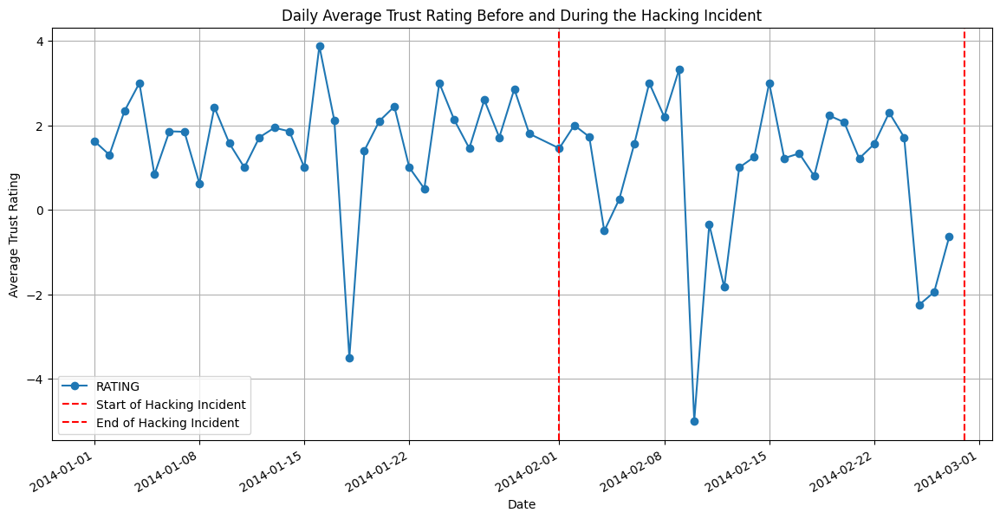

In [ ]:

df['datetime'] = pd.to_datetime(df['TIME'], unit='s')

# Define the period of the hacking incident (February 2014)
incident_start = pd.to_datetime('2014-02-01')
incident_end = pd.to_datetime('2014-02-28')

# Define the normal period (the month before the incident)
normal_start = pd.to_datetime('2014-01-01')
normal_end = pd.to_datetime('2014-01-31')

# Filter the DataFrame for both periods
incident_data = df[(df['datetime'] >= incident_start) & (df['datetime'] <= incident_end)]
normal_data = df[(df['datetime'] >= normal_start) & (df['datetime'] < normal_end)]

# Create network graphs for both periods
G_incident = nx.from_pandas_edgelist(incident_data, 'SOURCE', 'TARGET', edge_attr='RATING', create_using=nx.DiGraph())
G_normal = nx.from_pandas_edgelist(normal_data, 'SOURCE', 'TARGET', edge_attr='RATING', create_using=nx.DiGraph())

# Calculate average trust rating for both periods
avg_trust_incident = incident_data['RATING'].mean()
avg_trust_normal = normal_data['RATING'].mean()

# Visualize the drop in confidence with a line graph
import matplotlib.pyplot as plt

# Create a time series DataFrame with daily averages
incident_series = incident_data.set_index('datetime').resample('D')['RATING'].mean()
normal_series = normal_data.set_index('datetime').resample('D')['RATING'].mean()

# Combine the data into a single DataFrame
combined_series = pd.concat([normal_series, incident_series], axis=0)

# Plotting
plt.figure(figsize=(14, 7))
combined_series.plot(kind='line', marker='o')
plt.axvline(x=incident_start, color='r', linestyle='--', label='Start of Hacking Incident')
plt.axvline(x=incident_end, color='r', linestyle='--', label='End of Hacking Incident')
plt.title('Daily Average Trust Rating Before and During the Hacking Incident')
plt.xlabel('Date')
plt.ylabel('Average Trust Rating')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
# Step 1: Aggregate trust ratings for each node
# Calculate average trust rating given by each node
avg_trust_given = df.groupby('SOURCE')['RATING'].mean().reset_index(name='avg_trust_given')
# Calculate average trust rating received by each node
avg_trust_received = df.groupby('TARGET')['RATING'].mean().reset_index(name='avg_trust_received')

# Merge these averages into a single DataFrame
node_trust = pd.merge(avg_trust_given, avg_trust_received, left_on='SOURCE', right_on='TARGET', how='outer')
node_trust.fillna(0, inplace=True)

# Step 2: Prepare data for anomaly detection
# For simplicity, we're using just the trust metrics
X = node_trust[['avg_trust_given', 'avg_trust_received']]

# Step 3: Apply the Isolation Forest algorithm
clf = IsolationForest(random_state=42, contamination='auto')
node_trust['anomaly'] = clf.fit_predict(X)

# Step 4: Analyze the results
# Nodes marked as -1 are considered anomalies
anomalies = node_trust[node_trust['anomaly'] == -1]

print("Detected Anomalies:")
print(anomalies)


Detected Anomalies:
      SOURCE  avg_trust_given  TARGET  avg_trust_received  anomaly
19      20.0         3.578947    20.0            4.018868       -1
51      53.0        -0.789474    53.0            2.973684       -1
109    111.0        -0.923077   111.0            2.576923       -1
127    129.0         4.516129   129.0            3.411765       -1
145    147.0         5.666667   147.0            4.636364       -1
...      ...              ...     ...                 ...      ...
3778     0.0         0.000000  7557.0           -6.500000       -1
3779     0.0         0.000000  7559.0           -6.500000       -1
3780     0.0         0.000000  7567.0           -9.666667       -1
3781     0.0         0.000000  7572.0          -10.000000       -1
3782     0.0         0.000000  7574.0          -10.000000       -1

[520 rows x 5 columns]


<Figure size 1000x600 with 0 Axes>

<Axes: xlabel='avg_trust_given', ylabel='avg_trust_received'>

Text(0.5, 1.0, 'Scatter Plot of Anomalies in Trust Given vs. Trust Received')

Text(0.5, 0, 'Average Trust Given')

Text(0, 0.5, 'Average Trust Received')

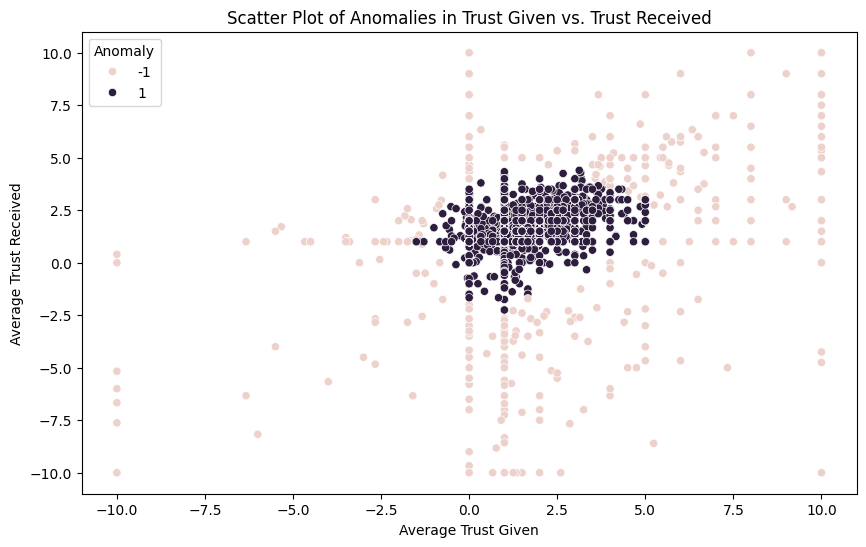

In [ ]:
# Create the scatterplot using seaborn
plt.figure(figsize=(10, 6))
sns.scatterplot(data=node_trust, x='avg_trust_given', y='avg_trust_received', hue='anomaly', )

# Define the title and the labels of the plot
plt.title('Scatter Plot of Anomalies in Trust Given vs. Trust Received')
plt.xlabel('Average Trust Given')
plt.ylabel('Average Trust Received')

# Show the plot
plt.legend(title='Anomaly')
plt.show()


<Axes: title={'center': 'SOURCE'}, ylabel='Frequency'>

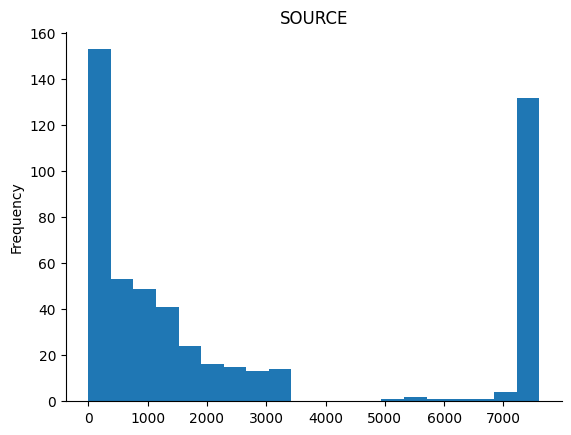

In [ ]:
# @title SOURCE

from matplotlib import pyplot as plt
anomalies['SOURCE'].plot(kind='hist', bins=20, title='SOURCE')
plt.gca().spines[['top', 'right',]].set_visible(False)

## Cluster abnormal nodes using K-means

<Figure size 1000x800 with 0 Axes>

 ...]

(-1.2039779829978943, 1.146625440120697, -1.182389043569565, 1.168613933324814)

Text(0.5, 1.0, 'Network Graph with Anomalies Highlighted')

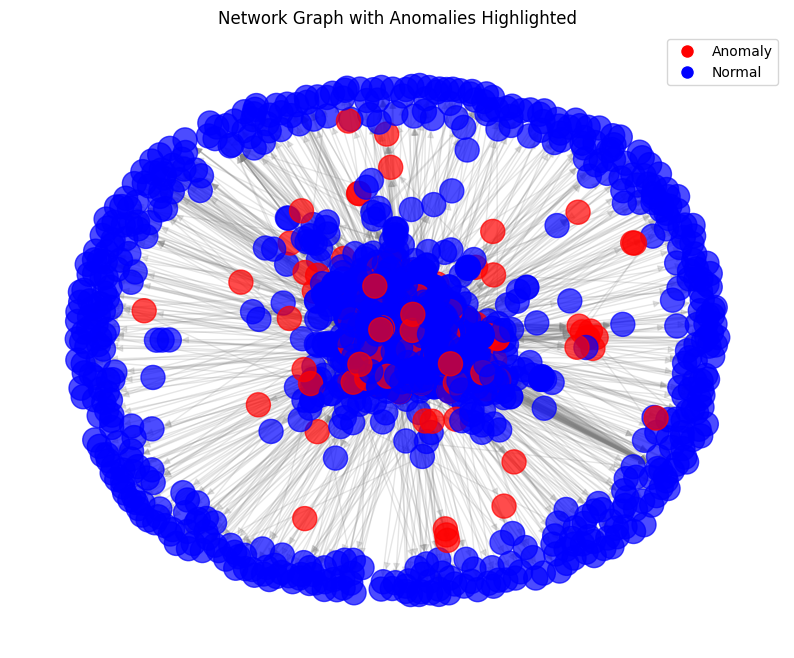

In [ ]:
# Convert anomalies' SOURCE column to a list for easy filtering
anomaly_nodes = anomalies['SOURCE'].tolist()

# Define node colors: 'red' for anomalies, 'blue' for normal nodes
node_colors = ['red' if node in anomaly_nodes else 'blue' for node in G.nodes()]

# Plot the network
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G)  # Positions for all nodes

# Drawing nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, alpha=0.7)

# Drawing edges
nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.2)

# Remove axis
plt.axis('off')

# Add title and legend
plt.title('Network Graph with Anomalies Highlighted')
red_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Anomaly')
blue_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Normal')
plt.legend(handles=[red_patch, blue_patch])

plt.show()


# Machine learning

In [ ]:

# Compute network-based features for each node
centrality = nx.degree_centrality(G)
node_features = pd.DataFrame({
    'node': list(G.nodes()),
    'centrality': [centrality[node] for node in G.nodes()],
    'anomaly_score': node_trust['anomaly']
}).set_index('node')

# Normalize features
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
node_features_scaled = pd.DataFrame(scaler.fit_transform(node_features), columns=node_features.columns, index=node_features.index)

from sklearn.cluster import KMeans

# Fit K-Means
kmeans = KMeans(n_clusters=2, random_state=42).fit(node_features_scaled)

# Assign cluster labels back to nodes
node_features['cluster'] = kmeans.labels_

# Heuristically identify which cluster might represent a 'confidence drop'
# This could be based on lower average trust ratings or higher anomaly scores within the cluster
confidence_drop_cluster = node_features.groupby('cluster').mean().idxmin()['anomaly_score']
node_features['confidence_drop'] = (node_features['cluster'] == confidence_drop_cluster).astype(int)


### Blue = Confidence drop, green = Seed nodes, red = normal nodes

<Figure size 1200x1200 with 0 Axes>

 ...]

Text(0.5, 1.0, 'Network Confidence Visualization Post-February 2014 Bitcoin Hack')

(-1.2072336763143539,
 1.1808884233236312,
 -1.190340911746025,
 1.198194300532341)

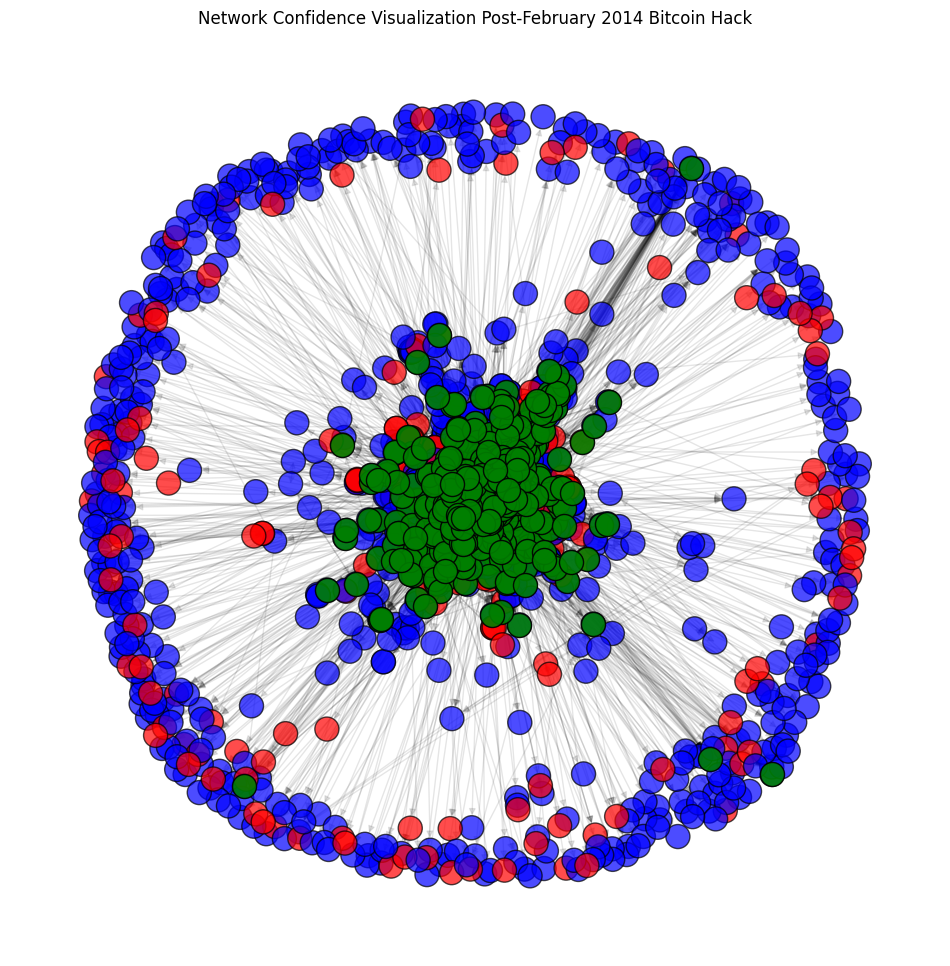

In [ ]:
# Determine node colors based on 'confidence_drop' label
node_colors = ['red' if node_features.loc[node, 'confidence_drop'] == 1 else 'blue' for node in G.nodes()]

# Optionally, identify key nodes to highlight (e.g., high-degree nodes or anomalies)
key_nodes = [node for node in G.nodes() if G.degree(node) > np.percentile([G.degree(n) for n in G.nodes()], 75)]

# Create the network visualization
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # For consistent layout between runs

# Draw nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, alpha=0.7, edgecolors='k')  # Edgecolors='k' adds a border for visibility

# Highlight key nodes with a distinct marker
nx.draw_networkx_nodes(G, pos, nodelist=key_nodes, node_color='green', edgecolors='k', alpha=0.9)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.1)

plt.title('Network Confidence Visualization Post-February 2014 Bitcoin Hack')
plt.axis('off')  # Hide axes for a cleaner look
plt.show()


<Figure size 1200x1200 with 0 Axes>

 ...]

{1: Text(0.00422500167042017, -0.004503034055233002, '1'),
 430: Text(0.09397035837173462, -0.0005892832414247096, '430'),
 804: Text(0.06686512380838394, -0.005772951524704695, '804'),
 160: Text(0.19319936633110046, -0.06827523559331894, '160'),
 95: Text(0.029703369364142418, 0.00010174110502703115, '95'),
 89: Text(-0.03728942573070526, 0.08269230276346207, '89'),
 161: Text(0.14388802647590637, 0.13682995736598969, '161'),
 256: Text(-0.052280690521001816, -0.009466467425227165, '256'),
 351: Text(-0.06724785268306732, -0.03333128243684769, '351'),
 649: Text(0.036360569298267365, 0.04234808310866356, '649'),
 87: Text(0.025105539709329605, -0.015626903623342514, '87'),
 37: Text(0.019971413537859917, 0.05226019769906998, '37'),
 309: Text(0.008918602019548416, 0.02822149358689785, '309'),
 637: Text(-0.020889732986688614, 0.04884057119488716, '637'),
 20: Text(0.09120019525289536, 0.0941883847117424, '20'),
 519: Text(0.04691150784492493, 0.06010162830352783, '519'),
 18: Text(0.

Text(0.5, 1.0, 'Network Confidence Visualization Post-February 2014 Bitcoin Hack')

(-1.2072336763143539,
 1.1808884233236312,
 -1.190340911746025,
 1.198194300532341)

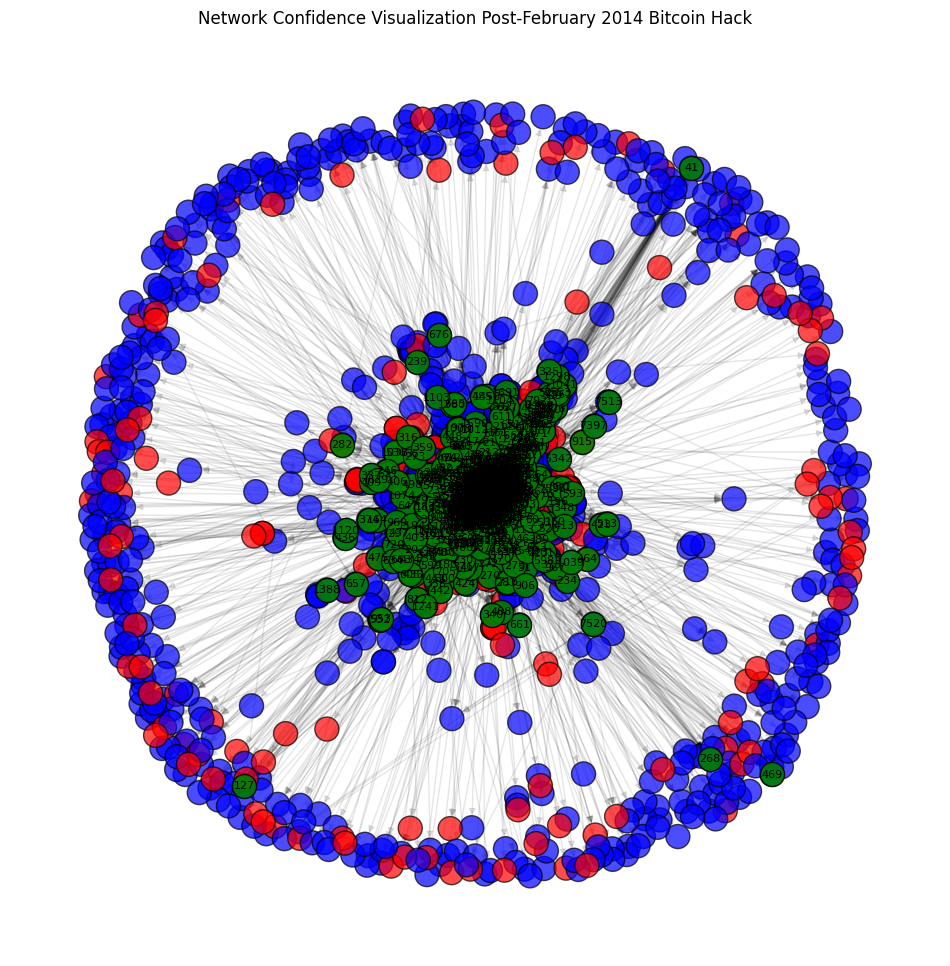

In [ ]:
plt.figure(figsize=(12, 12))
pos = nx.spring_layout(G, seed=42)  # Position nodes using the spring layout

# Draw all nodes
nx.draw_networkx_nodes(G, pos, node_color=node_colors, alpha=0.7, edgecolors='k')

# Highlight key nodes
nx.draw_networkx_nodes(G, pos, nodelist=key_nodes, node_color='green', edgecolors='k', alpha=0.9)

# Draw edges
nx.draw_networkx_edges(G, pos, alpha=0.1)

# Add labels only to key nodes to avoid clutter
labels = {node: node for node in key_nodes}  # Create a label dict for key nodes
nx.draw_networkx_labels(G, pos, labels, font_size=8, font_color='black')

plt.title('Network Confidence Visualization Post-February 2014 Bitcoin Hack')
plt.axis('off')
plt.show()

***2 - Machine learning algorithm : How likely is it that a node will leave its community in times of crisis or doubt?***

We know that the dataset is very unbalanced so we try to use SMOTE to reduce that. SMOTE (Synthetic Minority Over-sampling Technique) is an oversampling technique used to address the class imbalance problem in datasets. It aims to balance the distribution of classes by creating synthetic examples of the minority class rather than simply duplicating existing examples.

Here's how SMOTE works:

**Selection of Minority Class Examples**: SMOTE randomly selects examples from the minority class.
**Selection of Neighbors**: For each selected example, SMOTE identifies its k nearest neighbors in the feature space.
**Creation of Synthetic Example**s: SMOTE creates new examples by combining each minority class example with one or more of its selected neighbors. The features of the new examples are calculated by following a straight line in the feature space connecting the original example and its neighbor.

<ipython-input-20-2bb3df430cb5>:12: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



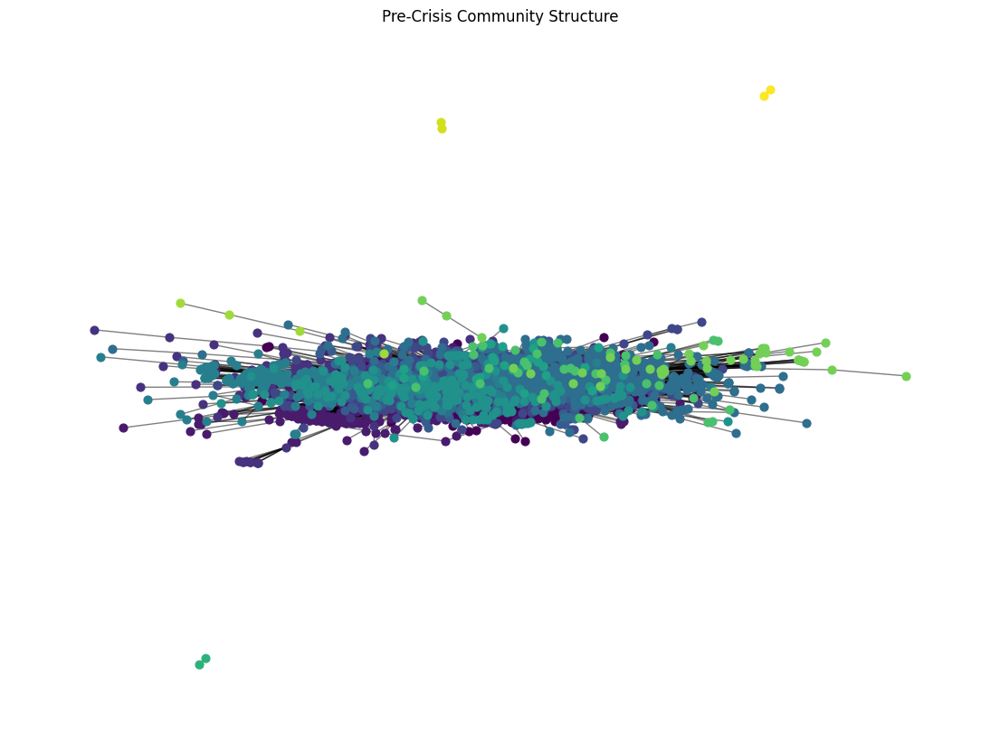

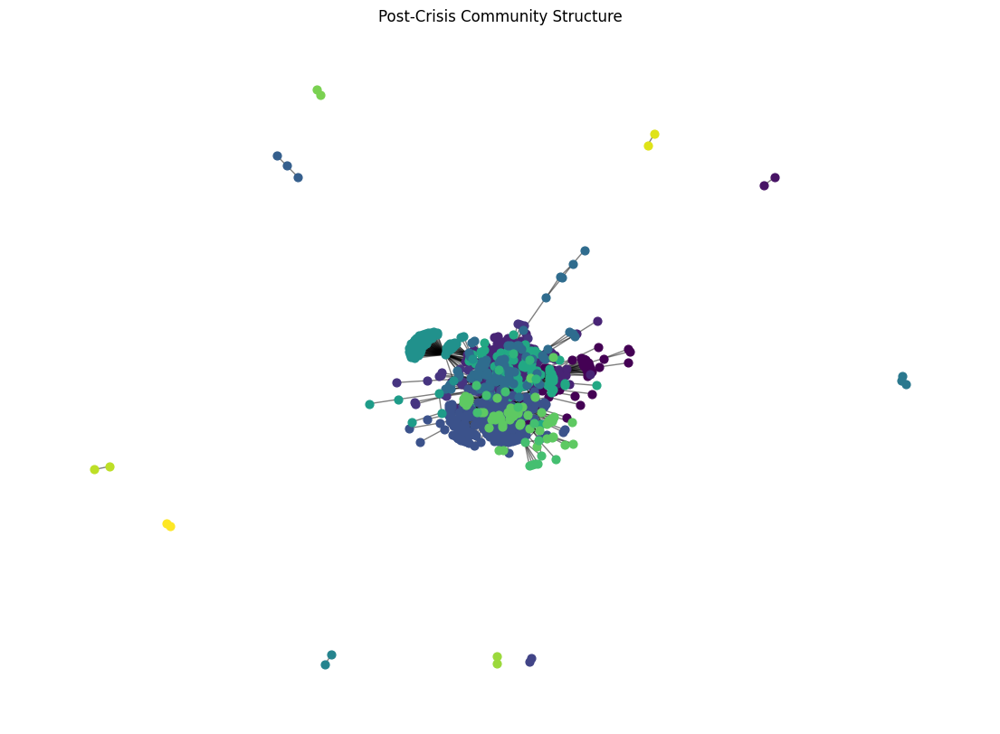

In [ ]:
# Helper function to draw the graph with communities
def draw_community_graph(G, partition, title):
    # Position maps for drawing
    pos = nx.spring_layout(G)

    # Create a mapping from community id to list of nodes in that community
    communities = {}
    for node, community in partition.items():
        if community not in communities:
            communities[community] = []
        communities[community].append(node)
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)

    # Draw the nodes and edges
    plt.figure(figsize=(14, 10))
    for community_id, nodes in communities.items():
        nx.draw_networkx_nodes(G, pos, nodes, node_size=40,
                               node_color=[cmap(community_id)])
    nx.draw_networkx_edges(G, pos, alpha=0.5)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Draw the pre-crisis community graph
draw_community_graph(G_pre, partition_pre, 'Pre-Crisis Community Structure')

# Draw the post-crisis community graph
draw_community_graph(G_post, partition_post, 'Post-Crisis Community Structure')

In [ ]:
# Define the centrality measures calculation function
def calculate_centrality_measures(G, nodes_data, prefix):
    centrality_dict = {
        'degree': dict(G.degree()),
        'weighted_degree': dict(G.degree(weight='weight')),
        'eigenvector': nx.eigenvector_centrality_numpy(G, weight='weight'),
        'closeness': nx.closeness_centrality(G),
        'betweenness': nx.betweenness_centrality(G, weight='weight')
    }

    for name, measure in centrality_dict.items():
        # We will create a new column for each measure with the prefix indicating pre or post crisis
        nodes_data[f'{prefix}_{name}'] = nodes_data['Id'].map(measure)


# Calculate centrality measures for pre-crisis and post-crisis graphs
calculate_centrality_measures(G_pre, nodes_data, 'pre')
calculate_centrality_measures(G_post, nodes_data, 'post')

print(nodes_data)

        Id  Degree  Pre_Crisis_Community  Changed_Community  pre_degree  \
0      430       9                     0                  1           9   
1        1     476                     6                  0         476   
2     3134       5                     6                  1           5   
3     3026       1                     6                  1           1   
4     3010       1                     6                  1           1   
...    ...     ...                   ...                ...         ...   
3464  5837       1                     1                  1           1   
3465  7465       1                     1                  1           1   
3466  7376       1                     7                  1           1   
3467  7461       1                     0                  1           1   
3468  7466       1                     4                  1           1   

      pre_weighted_degree  pre_eigenvector  pre_closeness  pre_betweenness  \
0                    

In our following pipeline:

- SMOTE(random_state=42) is used to generate synthetic examples of the minority class.
- XGBClassifier(use_label_encoder=False, eval_metric='logloss') is an XGBoost classifier configured for classification, with the eval_metric option set to 'logloss' to evaluate logarithmic loss during training.

Baseline model performance:
              precision    recall  f1-score   support

           0       0.04      0.55      0.08        20
           1       0.99      0.85      0.92      1715

    accuracy                           0.85      1735
   macro avg       0.52      0.70      0.50      1735
weighted avg       0.98      0.85      0.91      1735



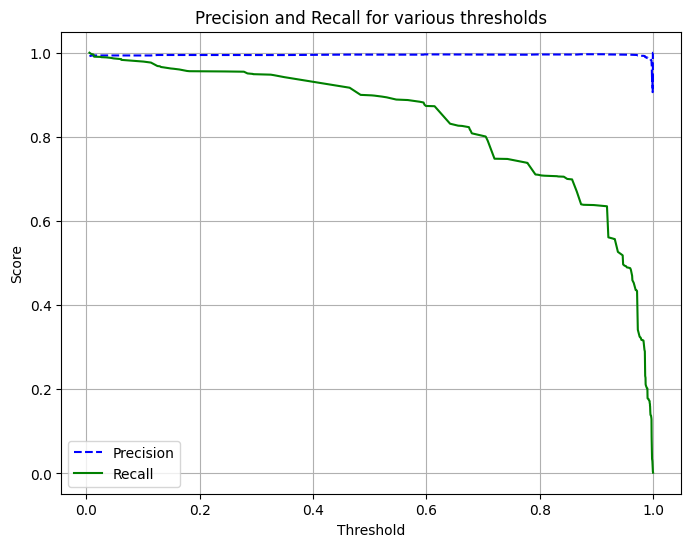

In [ ]:
# Prepare the data for the model
nodes_data = pd.DataFrame(list(G_pre.nodes()), columns=['Id'])
nodes_data['Degree'] = nodes_data['Id'].apply(lambda x: G_pre.degree(x))
nodes_data['Pre_Crisis_Community'] = nodes_data['Id'].apply(lambda x: partition_pre.get(x, -1))
nodes_data['Changed_Community'] = nodes_data['Id'].apply(lambda x: 1 if partition_pre.get(x, -1) != partition_post.get(x, -1) else 0)

# Select features and target
X = nodes_data[['Degree', 'Pre_Crisis_Community']]
y = nodes_data['Changed_Community']

# Splitting data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

# Creating a pipeline with SMOTE for oversampling and XGBClassifier
pipeline = ImblearnPipeline([
    ('smote', SMOTE(random_state=42)),
    ('xgb', XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
])

# Training the pipeline
pipeline.fit(X_train, y_train)

# Making predictions on the test set
y_pred = pipeline.predict(X_test)

# Evaluate the baseline model
print("Baseline model performance:")
print(classification_report(y_test, y_pred))

# Plotting the Precision-Recall curve to visualize the trade-off
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], 'b--', label='Precision')
plt.plot(thresholds, recall[:-1], 'g-', label='Recall')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision and Recall for various thresholds')
plt.legend(loc='lower left')
plt.grid(True)
plt.show()